In [0]:
%pip install databricks-vectorsearch
%pip install faiss-cpu
%pip install transformers[torch]
%pip install numpy scipy scikit-learn sentence-transformers
dbutils.library.restartPython()
#peft provides LoRA functionality
%pip install peft
%pip install evaluate

  Obtaining dependency information for databricks-vectorsearch from https://files.pythonhosted.org/packages/7c/3d/703c115043c737ab8dc7c4f48c1564afdfb5f1c4852ec226df0670ea0716/databricks_vectorsearch-0.43-py3-none-any.whl.metadata
  Obtaining dependency information for deprecation>=2 from https://files.pythonhosted.org/packages/02/c3/253a89ee03fc9b9682f1541728eb66db7db22148cd94f89ab22528cd1e1b/deprecation-2.1.0-py2.py3-none-any.whl.metadata
Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.
  Obtaining dependency information for faiss-cpu from https://files.pythonhosted.org/packages/e4/9c/aed8b7c6c490c777c404131b3f6a68e4924fbc149620dc6d6a3563435371/faiss_cpu-1.9.0.post1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
  Obtaining dependency information for numpy<3.0,>=1.25.0 from https://files.pythonhosted.org/packages/52/33/10825f580f42a353f744abc450dcd2a4b1e6f1931abb0ccbd1d63bd3993c/numpy-2.2.0-

In [0]:
%pip install transformers

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
%restart_python

In [0]:

import datasets # hugging face datasets
datasets.utils.logging.disable_progress_bar() # disable progress bars from hugging face

from sentence_transformers import SentenceTransformer

from databricks.vector_search.client import VectorSearchClient

import mlflow

import pyspark.sql.functions as fn

import pandas as pd
import json

import requests

import time

import numpy as np
import re
from flask import Flask, request, jsonify

import torch
from transformers import BertTokenizer, BertForSequenceClassification, Trainer, TrainingArguments
from datasets import load_dataset
from transformers import DistilBertTokenizer, DistilBertForSequenceClassification, TrainingArguments, Trainer

from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
from scipy.stats import ttest_rel

from pyspark.sql.functions import avg,explode,col
from tqdm import tqdm
import gc
from pyspark.sql import Row


from pyspark.sql.functions import col

import faiss

from transformers import AutoTokenizer, AutoModelForSequenceClassification



from peft import get_peft_model, LoraConfig, TaskType
import evaluate

2024-12-14 20:58:23.743602: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-12-14 20:58:23.748291: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-12-14 20:58:23.798975: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-14 20:58:25.110021: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [0]:
# DBTITLE 1,Instantiate Config
if 'config' not in locals().keys():
  config = {}

# DBTITLE 1,Product Database
# set catalog
config['catalog'] = 'llm_sentiment_product_recommender_uc'
s3_bucket_path = 's3://databricks-workspace-stack-6efc1-bucket/unity-catalog/'
# Create and use catalog
_ = spark.sql(f"CREATE CATALOG IF NOT EXISTS {config['catalog']} MANAGED LOCATION '{s3_bucket_path}'")
_ = spark.sql(f"USE CATALOG {config['catalog']}")

# set schema
config['schema'] = 'llm_sentiment_recommender'
_ = spark.sql(f"CREATE SCHEMA IF NOT EXISTS {config['schema']}")
_ = spark.sql(f"USE SCHEMA {config['schema']}")

# DBTITLE 1,Vector Search Index
config['vs index'] = 'product_index'

# DBTITLE 1,Model
config['embedding_model_name'] = 'llm_recommender_embeddings'

# S3
config['s3_bucket'] = "s3://databricks-workspace-stack-6efc1-bucket"
# GPT4ALL
config['gpt4all_endpoint'] = "https://0d08-129-130-19-24.ngrok-free.app/v1/chat/completions" 

config['faiss_index_path'] = "/dbfs/tmp/faiss_index.index" 

config['sentiment_model_save_path'] = "/dbfs/tmp/sentiment_model"

In [0]:
config['gpt4all_endpoint'] = "https://5c30-102-220-12-38.ngrok-free.app/v1/chat/completions" 

In [0]:
# Load the huggingface Amazon Reviews 2023 dataset (User Reviews and Metadata) -  All Beauty
user_reviews = datasets.load_dataset("McAuley-Lab/Amazon-Reviews-2023", "raw_review_All_Beauty", trust_remote_code=True)
item_metadata = datasets.load_dataset("McAuley-Lab/Amazon-Reviews-2023", "raw_meta_All_Beauty", split="full", trust_remote_code=True)

display(item_metadata)
display(user_reviews)

In [0]:
# Convert Hugging Face Dataset to Pandas DataFrame
user_reviews_df = user_reviews['full'].to_pandas()
item_metadata_df = item_metadata.to_pandas()

display(item_metadata_df)
display(user_reviews_df)

####It's important to note that the product_text field contains the concatenated names,categories,features and descriptions for our products.  This is the field on which we will base our later searches.

In [0]:
def create_detailed_product_text(row):
    
    title = row.get("title", "")
    main_category = row.get("main_category", "")
    parent_asin = row.get("parent_asin", "")
    # Extract description, categories, and features directly
    description = ", ".join(row["description"]) if row["description"].any() else ""
    categories = ", ".join(row["categories"]) if row["categories"].size > 0 else ""
    features = ", ".join(row["features"]) if row["features"].any() else ""
    # details = ", ".join(row["details"]) if row["details"] else ""
   

    # Build the dictionary structure for product_text
    product_text = {
        "title": title,
        "main_category": main_category,
        "description": description,
        "categories": categories,
        "features": features,
        "parent_asin":parent_asin
    }
    
    return product_text



# Apply the function to each row to create the product_text column
item_metadata_df["product_text"] = item_metadata_df.apply(create_detailed_product_text, axis=1)
item_metadata_df = item_metadata_df.astype(str)
# Display the DataFrame to check the result
display(item_metadata_df)

In [0]:
# drop columns
item_metadata_df = item_metadata_df.drop(columns=['images','videos'])
user_reviews_df = user_reviews_df.drop(columns=['images'])

In [0]:
# define Schema
from pyspark.sql.types import StructType, StructField, StringType, FloatType, IntegerType
item_schema = StructType([
    StructField("main_category", StringType(), True),
    StructField("title", StringType(), True),
    StructField("average_rating", StringType(), True),
    StructField("rating_number", StringType(), True),
    StructField("features", StringType(), True),
    StructField("description", StringType(), True),
    StructField("price", StringType(), True),
    # StructField("images", StringType(), True),
    #StructField("videos", StringType(), True),
    StructField("store", StringType(), True),
    StructField("categories", StringType(), True),
    StructField("details", StringType(), True),
    StructField("parent_asin", StringType(), True),
    StructField("bought_together", StringType(), True),
    StructField("subtitle", StringType(), True),
    StructField("author", StringType(), True),
    StructField("product_text", StringType(), True)
])
# create df
metadata_df = spark.createDataFrame(item_metadata_df, schema=item_schema)
reviews_df = spark.createDataFrame(user_reviews_df)
print("Reviews:",list(reviews_df.columns))
print("Product Data",list(metadata_df.columns))

In [0]:
# rename columns b4 merging

reviews_df = (reviews_df
      .withColumnRenamed("title", "review_title")
      .withColumnRenamed("text", "review_text")
      .withColumnRenamed("user_id", "review_user_id")
      .withColumnRenamed("timestamp", "review_timestamp")
      .withColumnRenamed("helpful_vote", "review_helpful_vote")
      .withColumnRenamed("verified_purchase", "review_verified_purchase")
      .withColumnRenamed("rating", "review_rating"))

In [0]:
# Merge the datasets on the 'parentasin' column
#combined_df = reviews_df.join(metadata_df, "parent_asin", "inner")

In [0]:
# DBTITLE 1,Persist as Delta Lake Table
# drop any pre-existing indexes on table
vs_client = VectorSearchClient()
try:
  vs_client.delete_index(f"{config['catalog']}.{config['schema']}.{config['vs index']}")
except:
  print('Ignoring error message associated with vs index deletion ...')
  pass


# create table to hold product info
_ = spark.sql('''
  CREATE OR REPLACE TABLE products (
    id bigint GENERATED ALWAYS AS IDENTITY,
    parent_asin string,
    main_category string,
    title string,
    average_rating string,
    rating_number string,
    features string,
    description string,
    price string,
    store string,
    categories string,
    details string,
    bought_together string,
    subtitle string,
    author string,
    product_text string,
    avg_sentiment_score double
    )'''
  )

# create table to hold product info
_ = spark.sql('''
  CREATE OR REPLACE TABLE reviews (
    id bigint GENERATED ALWAYS AS IDENTITY,
    parent_asin string,
    review_rating double,
    review_title string,
    review_text string,
    asin string,
    review_user_id string,
    review_timestamp long,
    review_helpful_vote long,
    review_verified_purchase boolean
    )'''
  )

In [0]:
# add product info to table
_  = (
    metadata_df
    .select('main_category','title','average_rating','rating_number','features','description','price','store','categories','details','parent_asin','bought_together','subtitle','author','product_text')
    .write
    .format('delta')
    .mode('append')
    .saveAsTable('products')
  )

In [0]:


# add reviews info to table
_  = (
    reviews_df
    .select('parent_asin','review_rating','review_title','review_text','asin','review_user_id','review_timestamp','review_helpful_vote','review_verified_purchase') # fields in correct order 
    .write
    .format('delta')
    .mode('append')
    .saveAsTable('reviews')
  )



In [0]:
reviews_location = spark.sql("DESCRIBE DETAIL reviews").select("location").collect()[0]["location"]
print(f"The 'reviews' table is saved at: {reviews_location}")

In [0]:
# read data from delta lake table
products = spark.table('products')
reviews = spark.table('reviews')

# display table contents
display( products )
display( reviews )

id,parent_asin,main_category,title,average_rating,rating_number,features,description,price,store,categories,details,bought_together,subtitle,author,product_text,avg_sentiment_score
2,B009VZYZGA,All Beauty,Magic Organic Balm Cherry Blossom 14g,3.7,9,[],[],None,Dr. Bronner (Dr.Bronner's),[],"{""Brand"": ""Dr. Bronner (Dr.Bronner's)"", ""Scent"": ""Cherry Blossom"", ""Item Form"": ""Balm"", ""Unit Count"": ""1.00 Count"", ""Number of Items"": ""1"", ""Is Discontinued By Manufacturer"": ""No"", ""Product Dimensions"": ""2.05 x 2.05 x 0.63 inches; 0.48 Ounces"", ""UPC"": ""018787912072""}",None,None,None,"{'title': 'Magic Organic Balm Cherry Blossom 14g', 'main_category': 'All Beauty', 'description': '', 'categories': '', 'features': '', 'parent_asin': 'B009VZYZGA'}",null
14,B08KTWVJCT,All Beauty,"FamzZONUS Silicone Bath Body Brush- Silicone Body Scrubber 31 inch, Back Scrubber for Shower, Silicone Body Brush, Back Washer for Shower, Silicone Back Brush for Women and Men",4.3,111,[],[],None,Famz,[],"{""Material"": ""Silicone"", ""Brand"": ""Famz"", ""Power Source"": ""Hand_powered"", ""Item Dimensions LxWxH"": ""6.5 x 10.24 x 1.85 inches"", ""Product Benefits"": ""Softening,Massage,Revitalizing,Pores,Clean,Exfoliating,Blood Circulation"", ""Product Dimensions"": ""6.5 x 10.24 x 1.85 inches; 10.72 Ounces"", ""UPC"": ""755003911920"", ""Manufacturer"": ""famz""}",None,None,None,"{'title': 'FamzZONUS Silicone Bath Body Brush- Silicone Body Scrubber 31 inch, Back Scrubber for Shower, Silicone Body Brush, Back Washer for Shower, Silicone Back Brush for Women and Men', 'main_category': 'All Beauty', 'description': '', 'categories': '', 'features': '', 'parent_asin': 'B08KTWVJCT'}",null
26,B071H7GX5Z,All Beauty,Victorias Secret Pink Limited Edition Island Glow Fresh Glow Lotion with Beverage Cover 12 fl oz.,4.6,2,['Scent: Island Glow' '12 fl oz.'],[],None,Victoria's Secret,[],"{""Brand"": ""Victoria's Secret"", ""Item Form"": ""Lotion"", ""Unit Count"": ""1.00 Count"", ""Number of Items"": ""1"", ""Item Volume"": ""355 Milliliters"", ""Product Dimensions"": ""1.77 x 3.07 x 6.5 inches; 1 Pounds"", ""UPC"": ""667543088041"", ""Manufacturer"": ""Victoria's Secret""}",None,None,None,"{'title': 'Victorias Secret Pink Limited Edition Island Glow Fresh Glow Lotion with Beverage Cover 12 fl oz.', 'main_category': 'All Beauty', 'description': '', 'categories': '', 'features': 'Scent: Island Glow, 12 fl oz.', 'parent_asin': 'B071H7GX5Z'}",null
38,B07RRB7DR4,Premium Beauty,Sol de Janeiro Brazilian Kiss Cupuaçu Lip Butter,4.7,2503,[],[],18.0,None,[],"{""Brand"": ""SOL DE JANEIRO"", ""Item Form"": ""Oil"", ""Skin Type"": ""Dry"", ""Color"": ""Clear"", ""Product Benefits"": ""A blend of cupua\u00e7u butter, a\u00e7a\u00ed oil, and coconut oil provide deep hydration."", ""Is Discontinued By Manufacturer"": ""No"", ""Package Dimensions"": ""3.54 x 1.3 x 1.06 inches; 0.3 Ounces"", ""Item model number"": ""B01N5CJPSX"", ""UPC"": ""851604006277 887167266896 851604006109""}",None,None,None,"{'title': 'Sol de Janeiro Brazilian Kiss Cupuaçu Lip Butter', 'main_category': 'Premium Beauty', 'description': '', 'categories': '', 'features': '', 'parent_asin': 'B07RRB7DR4'}",null
50,B0B2QDXQ7T,All Beauty,"Pout Lip Scrub All Natural Ingredients & Edible | Hydrate, Exfoliate and Repair Your Lips (Pina Colada)",5.0,1,"['LIP THERAPY FOR DRY LIPS: Nourishes, naturally plumps, and protects so you can pop that pout and have hydrated lips all year long - even during the driest months.' 'EASY TO USE TRAVEL-FRIENDLY: Formulated to be solid until touched, it travels in your purse or luggage without mess. TO USE: Simply scoop out a small amount with your finger and rub on your lips to remove slouchiness and to hydrate. Wash or lick away any excess.' 'ULTIMATE DRY SKIN RELIEF: Masterfully formulated with a unique blend of sustainable beeswax, botanical oils, & butters that deeply penetrate to nourish the skin, and dries to a silky finish that is touchably-soft all day long.' '10

id,parent_asin,review_rating,review_title,review_text,asin,review_user_id,review_timestamp,review_helpful_vote,review_verified_purchase
9,B07DQGT2JH,5.0,Perfect.,These last. They're strong and sturdy.,B07DQLFPW1,AFFD3D2EIZFFIU4TZWCHWCSKM2ZQ,1646687589315,0,true
80,B07JM2DZV1,1.0,Garbage,"These are not only extremely tiny, but they are very brittle and weak.",B07JM2DZV1,AFFD3D2EIZFFIU4TZWCHWCSKM2ZQ,1643752286950,0,true
151,B07D7J6H27,5.0,Lo mejor,Lo compre por q mi mamá está sufriendo de dolores por su edad y ahora ellaDuerme y está feliz sin dolor en sus articulaciones,B07D7J6H27,AGGPO6GLDQYQK3CBG3CVMIRVF6KQ,1629233313529,4,true
222,B08J48FRSQ,5.0,Fantastic Soap!,"Gelo is wonderful! I didn't buy it here, but directly from their site, much less expensive ordered direct! It's environmentally friendly, easy to use, takes almost no storage space, & smells wonderful. Made with essential oils, & natural ingredients, is a selling point for me.",B08J48FRSQ,AF3GVEZEOIT2UJPUMIEWKAMMKVPQ,1601748042796,6,false
293,B00GMPCWHG,5.0,I love it!,"I have been using this product for many years. When I decided to let my hair stay gray, this product was a life saver. What can I say? I love it!",B00GMPCWHG,AFPKUUNAMF7N2IZMGVUZJXWEQ3QQ,1493312906000,1,true
364,B08HRRJZSD,1.0,This was a no for me!,"This cream blush is so greasy. I guess if you have super dry skin, it would be good. I just did not like the texture/feel of it at all.",B08HRRJZSD,AERO7JIZXFW57VBGKZ4V3T6I7YUA,1620782625073,0,true
435,B08K2XQNXD,1.0,Flimsy,Not worth the money,B08K2XQNXD,AHAFNHH437NN4F3XBAO2XOSZY6DA,1615850627852,0,true
506,B07RFKJZ5M,5.0,Nice product,Item works well,B07RFKJZ5M,AEM4UR4MKRJJJJVIB4YPUYHO4DTA,1576750152215,0,true
577,B072JX8LV5,5.0,Stays on very well and does not rub off.,I really like this product because it is waterproof when I swim. I do not like applying the product with the round brush that comes with it. I can’t seem to control application as well as with a small angled brush that I already had on hand. This is the second time I have bought this product. I have tried other brands but I like this one the best.,B072JX8LV5,AEFFQP5G3LCMTBGRP3B4D2WIP4IQ,1623963567796,0,true
648,B072JX98Y6,3.0,Product liquid acceptable but applicator brush not so good.,The product in the tube is fine but I only gave it three stars because the applicator brush is a real mess to try to use. It is a round brush and puts way too much product on and is impossible to control. I got a small angled brush and applied a small amount with that brush. If you use a small brush the product goes on fine. Just don't try to use the brush that comes with it or you will have the product in places you dont want it. I had been using Wunderbrow and wanted to compare the two. The brush in it is like a tiny paint brush and it works fine. That is the kind of brush Blissful Brows should be using in their tube. The actual liquid in both products seem to be quite similar. It's just the brushes that are very different.,B072JX98Y6,AEFFQP5G3LCMTBGRP3B4D2WIP4IQ,1507066764998,1,true


## Model Building and Deployment

In [0]:

# Load the SentenceTransformer model

device = 'cuda' if torch.cuda.is_available() else 'cpu'
embedding_model = SentenceTransformer('all-MiniLM-L6-v2', device=device)
#subset_df = metadata_df.limit(10000)
# Convert product text to a list for efficient processing
product_texts = metadata_df.select(col("product_text")).rdd.flatMap(lambda x: x).collect()

batch_size = 8

# Process each batch and append to Delta table
for start in tqdm(range(0, len(product_texts), batch_size), desc="Encoding batches"):
    end = start + batch_size
    batch_texts = product_texts[start:end]
    
    # Generate embeddings for the batch
    batch_embeddings = embedding_model.encode(batch_texts, batch_size=batch_size)
    
    # Create DataFrame from batch
    df_batch = spark.createDataFrame([
        Row(product_text=text, embedding=embedding.tolist())  # Ensure embeddings are lists
        for text, embedding in zip(batch_texts, batch_embeddings)
    ])
    
    # Check if Delta table exists
    if start == 0:
        # Write first batch to create Delta table
        df_batch.write.format("delta").mode("overwrite").saveAsTable('product_embeddings')
    else:
        # Append subsequent batches to Delta table
        df_batch.write.format("delta").mode("append").saveAsTable('product_embeddings')

    # Memory cleanup
    del batch_texts, batch_embeddings, df_batch
    gc.collect()


In [0]:
from tqdm import tqdm
from pyspark.sql import Row
from pyspark.sql.functions import col
from sentence_transformers import SentenceTransformer
import torch
# Initialize the embedding model (no need to reinitialize in each partition)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
embedding_model = SentenceTransformer('all-MiniLM-L6-v2', device=device)
metadata_df = spark.table('products')

# Limit data to the first 10,000 rows for testing
#subset_df = metadata_df.limit(10000)

# Define the function to process each partition
def encode_partition(partition):
    for row in partition:
        parent_asin = row['parent_asin']
        text = row['product_text']
        embedding = embedding_model.encode([text])[0].tolist()  # Generate embedding
        yield (parent_asin, text, embedding)

# Apply `mapPartitions` for parallel processing across Spark executors
encoded_rdd = metadata_df.rdd.mapPartitions(encode_partition)
# Convert RDD to DataFrame with specified schema
encoded_df = encoded_rdd.toDF(["parent_asin","product_text", "embedding"])

# Write the DataFrame to Delta table on S3
encoded_df.write.format("delta").mode("overwrite").saveAsTable("product_metadata_embeddings")



In [0]:


embeddings_df = spark.table('product_metadata_embeddings')

# Extract embeddings as a list of numpy arrays
product_embeddings = np.array(embeddings_df.select("embedding").rdd.flatMap(lambda x: x).collect())


# Build FAISS Index
# Initialize FAISS index with L2 distance metric
index = faiss.IndexFlatL2(product_embeddings.shape[1])
index.add(product_embeddings)  # Add all embeddings to the FAISS index

# Verify FAISS index size
print("FAISS index size:", index.ntotal)  # Should match number of embeddings

# Step 3: Save FAISS Index for Future Use
#config['faiss_index_path']
faiss_index_path = "/dbfs/tmp/faiss_index.index"  # Local DBFS path

# Save the FAISS index
faiss.write_index(index, faiss_index_path)

# Sentiment Model Building: SST5 ground truth

In [0]:
# Text Cleaning Pipeline
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tag import pos_tag

# Initialize the lemmatizer
lemmatizer = WordNetLemmatizer()
    
# Text Cleaning Pipeline
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

from nltk.tag import pos_tag
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
# Initialize the lemmatizer
lemmatizer = WordNetLemmatizer()
    
def clean_pipeline(text):
    
    # Step 1: Lower all the cases in 'text'
    text = text.lower()
    
    # remove special characters, keeping words and numbers
    clean_text = re.sub("[^a-zA-Z0-9]"," ",text)
    
    # Step 2: Tokenizing sentences into words
    token_list = word_tokenize(clean_text)
    
    # Step 3: Removing stopwords and meaningless words
    
    # Load the default NLTK stopwords set for English
    stop_words = set(stopwords.words('english'))

    # # Define your own set of additional stopwords to add
    # additional_stopwords = {}

    # # Combine the default set with your additional stopwords
    # stop_words = stop_words.union(additional_stopwords)
    
    # Save the non-stopwords in a list
    filtered_tokens = [word for word in token_list if word not in stop_words]
    
    # Step 4: Lemmatizing the list without stopwords
    lemma_words = [lemmatizer.lemmatize(word) for word in filtered_tokens]
    
    # step 5: filtering nouns and adjectives
    word_tag = pos_tag(lemma_words)
    
    nouns_adjs = [word for word, tag in word_tag if "NN" or "NNP" or "NNS" or "JJ" or "JJR" or "JJS" in tag]
    nouns_adjs_text = ' '.join(nouns_adjs)
    
    merged_text = ' '.join(lemma_words)
    
    
    return merged_text
text = clean_pipeline("I love this product")
text

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


'love product'

In [0]:
# Specify a persistent cache directory under DBFS
cache_dir = "/dbfs/tmp/huggingface_cache"
# Load the dataset
sst5 = load_dataset("SetFit/sst5",cache_dir=cache_dir)
sst5
# display percentage of training data with label = 1


Repo card metadata block was not found. Setting CardData to empty.
Repo card metadata block was not found. Setting CardData to empty.


DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'label_text'],
        num_rows: 8544
    })
    validation: Dataset({
        features: ['text', 'label', 'label_text'],
        num_rows: 1101
    })
    test: Dataset({
        features: ['text', 'label', 'label_text'],
        num_rows: 2210
    })
})

In [0]:
sst5['train'].to_pandas().count()

text          8544
label         8544
label_text    8544
dtype: int64

In [0]:
sst5['validation'].to_pandas().count()

text          1101
label         1101
label_text    1101
dtype: int64

In [0]:
sst5['test'].to_pandas().count()

text          2210
label         2210
label_text    2210
dtype: int64

In [0]:
# display percentage of training data with label = 1
np.array(sst5['train']['label']).sum()/len(sst5['train']['label'])

2.0580524344569286

#### Preprocessing: Setup Tokenizer

In [0]:
# Tokenizer
def tokenize_function(examples):
    return tokenizer(examples['text'], padding="max_length", truncation=True)


#### Setup Evalution Metrics

In [0]:

# import accuracy evaluation metric
accuracy = evaluate.load("accuracy")

In [0]:
# define an evaluation function to pass into trainer later

from sklearn.metrics import precision_recall_fscore_support, roc_auc_score
import numpy as np
from scipy.special import softmax

def compute_metrics(eval_pred):
    """
    Calculate Precision, Recall, F1-Score, and ROC-AUC for binary and multi-class tasks.
    """
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=1)  # Predicted class labels

    # Precision, Recall, F1-Score
    precision, recall, f1, _ = precision_recall_fscore_support(
        labels, predictions, average="weighted"
    )

    # Calculate ROC-AUC
    roc_auc = None
    try:
        if logits.shape[1] == 2:  # Binary classification
            probs = softmax(logits, axis=1)  # Convert logits to probabilities
            roc_auc = roc_auc_score(labels, probs[:, 1])  # Use probabilities for the positive class
        else:  # Multi-class classification
            roc_auc = roc_auc_score(labels, logits, multi_class="ovr")  # One-vs-Rest
    except ValueError as e:
        print(f"ROC-AUC not applicable: {e}")

    return {
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "roc_auc": roc_auc,
    }



### Test Product 1: "Eco-Friendly Water Bottle"
Title: "Reusable Eco-Friendly Water Bottle"
Description: "A BPA-free, reusable water bottle designed for durability and convenience. Keeps drinks cold for 24 hours and hot for 12 hours."
Reviews:
- "Absolutely love this bottle! Keeps my water cold all day. Very eco-friendly."
- "Good product but dents easily if dropped."
- "I like the design, but it doesn’t keep drinks warm as advertised."
- "Perfect for hikes and gym sessions. Lightweight and durable."
- "Stopped working after a few weeks. Not worth the price."

### Test Product 2: "Wireless Earbuds"
Title: "Noise-Canceling Wireless Earbuds"
Description: "High-quality wireless earbuds with active noise canceling, long battery life, and deep bass audio."
Reviews:
- "Sound quality is top-notch! Better than my old earbuds."
- "Battery life is good, but the noise canceling could be better."
- "Amazing bass and very comfortable to wear."
- "Stopped connecting to my phone after a month. Very disappointed."
- "Worth every penny! Great for commuting."

### Test Product 3: "Organic Coffee Beans"
Title: "100% Organic Arabica Coffee Beans"
Description: "Premium, ethically sourced coffee beans with a rich, bold flavor. Perfect for espresso and French press."
Reviews:
- "This coffee is so smooth and flavorful. A must-try for coffee lovers!"
- "Too bitter for my taste. Not as fresh as I expected."
- "Absolutely delicious! The best coffee I've ever had."
- "A bit pricey, but the quality is excellent."
- "Tastes great, but the packaging could be better."

### Test Product 4: "Fitness Tracker Watch"
Title: "Fitness Tracker with Heart Rate Monitor"
Description: "Track your steps, calories, sleep, and heart rate with this stylish fitness tracker. Water-resistant and compatible with most smartphones."
Reviews:
- "Fantastic tracker! Helped me stay on top of my fitness goals."
- "The heart rate monitor isn’t very accurate."
- "Good value for the price, but the app needs improvement."
- "Works well for tracking steps but not great for detailed workouts."
- "Battery life is impressive. I only charge it once a week."

### Test Product 5: "Luxury Face Cream"
Title: "Anti-Aging Luxury Face Cream"
Description: "A rejuvenating cream with natural ingredients that reduce wrinkles and hydrate your skin. Dermatologist recommended."
Reviews:
- "My skin feels so much smoother after using this cream for a week!"
- "It’s good but too expensive for what it offers."
- "Did not work for me. Caused irritation."
- "Smells amazing and absorbs quickly into the skin."
- "Noticeable difference in my skin texture. Worth every cent."



## Fine tuning Bert with SST5 as ground truth

In [0]:
# Initialize BERT tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

tokenized_sst5 = sst5.map(tokenize_function, batched=True)
tokenized_sst5.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
tokenized_sst5

DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'label_text', 'input_ids', 'token_type_ids', 'attention_mask'],
        num_rows: 8544
    })
    validation: Dataset({
        features: ['text', 'label', 'label_text', 'input_ids', 'token_type_ids', 'attention_mask'],
        num_rows: 1101
    })
    test: Dataset({
        features: ['text', 'label', 'label_text', 'input_ids', 'token_type_ids', 'attention_mask'],
        num_rows: 2210
    })
})

In [0]:

# Load BERT model for sequence classification with 5 sentiment classes
sentiment_model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=5)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


- Applying untrained model to some text
- In here the new thing that we encounter is the function logits, what logits does is it converts probability ranging between 0 to 1 to real numbers extending from negative to positive numbers.

In [0]:
# define list of examples
text_list = ["Absolutely love this bottle! Keeps my water cold all day. Very eco-friendly.", 
             "resourceful and ingenious entertainment nice.", 
             "Battery life is good, but the noise canceling could be better.", 
             "Absolutely delicious! The best coffee I've ever had.",
             "Works well for tracking steps but not great for detailed workouts.", 
             "Smells amazing and absorbs quickly into the skin.",
             "Sound quality is top-notch! Better than my old earbuds",
             "Too bitter for my taste. Not as fresh as I expected.very bad",
             "Did not work for me. Caused irritation."
             ]

for text in text_list:
    # tokenize text
    inputs = tokenizer.encode(text, return_tensors="pt")
    # compute logits
    logits = sentiment_model(inputs).logits
    # convert logits to label
    predictions = torch.argmax(logits)

    print(text + " - " + str(predictions.tolist()))

Absolutely love this bottle! Keeps my water cold all day. Very eco-friendly. - 2
resourceful and ingenious entertainment nice. - 3
Battery life is good, but the noise canceling could be better. - 2
Absolutely delicious! The best coffee I've ever had. - 2
Works well for tracking steps but not great for detailed workouts. - 2
Smells amazing and absorbs quickly into the skin. - 2
Sound quality is top-notch! Better than my old earbuds - 2
Too bitter for my taste. Not as fresh as I expected.very bad - 2
Did not work for me. Caused irritation. - 2


In [0]:
from transformers import BertForSequenceClassification, Trainer, TrainingArguments
import torch  

# Load BERT model for sequence classification with 5 sentiment classes
sentiment_model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=5)

# Set training arguments for fine-tuning
training_args = TrainingArguments(
    output_dir='./results_bert',
    eval_strategy="epoch",  # Updated key for evaluation strategy
    num_train_epochs=3,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    logging_dir='./logs_bert',
    logging_strategy="epoch",
    save_strategy="epoch",
    disable_tqdm=False,  # For clearer debugging
    fp16=torch.cuda.is_available(),  # Use mixed precision only if CUDA is available
   
)

# Fine-tune the model using SST-5
trainer = Trainer(
    model=sentiment_model,
    args=training_args,
    train_dataset=tokenized_sst5['train'],
    eval_dataset=tokenized_sst5["validation"],
    tokenizer=tokenizer,
    compute_metrics=compute_metrics
)
trainer.train()

sentiment_model_save_path = "/dbfs/tmp/sentiment_model_bert"
sentiment_model.save_pretrained(sentiment_model_save_path)
tokenizer.save_pretrained(sentiment_model_save_path)

s3_save_path_model = "s3://databricks-workspace-stack-6efc1-bucket/sentiment_model_bert"
sentiment_model.save_pretrained(s3_save_path_model)
tokenizer.save_pretrained(s3_save_path_model)

trainable params: 151,301 || all params: 109,637,386 || trainable%: 0.1380


Step,Training Loss
100,1.586800
200,1.570100
300,1.578500
400,1.580800
500,1.582900
600,1.587500
700,1.573000
800,1.594500
900,1.567200
1000,1.579700


/databricks/python/lib/python3.11/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
You are using a model of type distilbert to instantiate a model of type bert. This is not supported for all configurations of models and can yield errors.
/databricks/python/lib/python3.11/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
You are using a model of type distilbert to instantiate a model of type bert. This is not supported for all configurations of models and can yield errors.
/databricks/python/lib/python3.11/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `res

('s3://databricks-workspace-stack-6efc1-bucket/lora_sentiment_model2/tokenizer_config.json',
 's3://databricks-workspace-stack-6efc1-bucket/lora_sentiment_model2/special_tokens_map.json',
 's3://databricks-workspace-stack-6efc1-bucket/lora_sentiment_model2/vocab.txt',
 's3://databricks-workspace-stack-6efc1-bucket/lora_sentiment_model2/added_tokens.json')

In [0]:
# Specify the directory to save the trainer and its components
trainer_save_directory = "/dbfs/tmp/sentiment_model_trainer"
# Save the model, tokenizer, and training arguments
trainer.save_model(trainer_save_directory)
s3_trainer_save_path2 = "s3://databricks-workspace-stack-6efc1-bucket/sentiment_model_trainer"
trainer.save_model(s3_trainer_save_path2)

# Save the training arguments
torch.save(training_args, f"{trainer_save_directory}/training_args.bin")

In [0]:
# utilize saved training model
from transformers import Trainer, TrainingArguments, AutoModelForSequenceClassification, AutoTokenizer
import torch

# Load the saved model and tokenizer
saved_model = AutoModelForSequenceClassification.from_pretrained(trainer_save_directory)
saved_tokenizer = AutoTokenizer.from_pretrained(sentiment_model_save_path)

# Load training arguments
saved_training_args = torch.load(f"{trainer_save_directory}/training_args.bin")

# Reinitialize the Trainer
saved_trainer2 = Trainer(
    model=saved_model,
    args=saved_training_args,
    tokenizer=tokenizer,
)


In [0]:
# Evaluate the model after training
results = trainer.evaluate(eval_dataset=tokenized_sst5["validation"])

print(f"Results: {results}")

Trainer is attempting to log a value of "{'accuracy': 0.254314259763851}" of type <class 'dict'> for key "eval_accuracy" as a metric. MLflow's log_metric() only accepts float and int types so we dropped this attribute.
Trainer is attempting to log a value of "{'accuracy': 0.254314259763851}" of type <class 'dict'> for key "eval/accuracy" as a scalar. This invocation of Tensorboard's writer.add_scalar() is incorrect so we dropped this attribute.


Results: {'eval_loss': 1.575241208076477, 'eval_accuracy': {'accuracy': 0.254314259763851}, 'eval_runtime': 888.0689, 'eval_samples_per_second': 1.24, 'eval_steps_per_second': 0.155, 'epoch': 3.0}


In [0]:
import json

# Save results to a JSON file
results_path = "/dbfs/tmp/lora_sentiment_model/evaluation_results.json"
results_s3_path = "s3://databricks-workspace-stack-6efc1-bucket/sentiment_model_evaluation_results.json"
with open(results_path, "w") as f:
    json.dump(result, f)
with open(results_s3_path, "w") as f:
    json.dump(result, f)

print(f"Results saved to {results_path}")
print(f"Results saved to {results_s3_path}")

In [0]:
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score ,confusion_matrix
import numpy as np

# Obtain predictions and true labels
predictions_output = trainer.predict(tokenized_sst5["validation"])


# Extract logits and labels
logits = predictions_output.predictions
labels = predictions_output.label_ids

# Convert logits to predicted class labels
predicted2_labels = np.argmax(logits, axis=1)

# Precision, Recall, F1-Score
precision, recall, f1, _ = precision_recall_fscore_support(
    labels, predicted_labels, average="weighted"
)

# ROC-AUC (applicable for binary or multi-class classification)
try:
    roc_auc = roc_auc_score(labels, logits, multi_class="ovo")
except ValueError:
    roc_auc = None  # ROC-AUC not applicable for some cases



# Compute confusion matrix
conf_matrix = confusion_matrix(labels, predicted_labels)


# Print results
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}") 
print("Confusion Matrix:")
print(conf_matrix)
if roc_auc is not None:
    print(f"ROC-AUC: {roc_auc:.4f}")
else:
    print("ROC-AUC: Not applicable for this task.")

Precision: 0.1403
Recall: 0.2543
F1-Score: 0.1254
Confusion Matrix:
[[  0   3   0 136   0]
 [  0  16   0 273   0]
 [  0  18   0 211   0]
 [  0  15   0 264   0]
 [  0   3   0 162   0]]
ROC-AUC: Not applicable for this task.


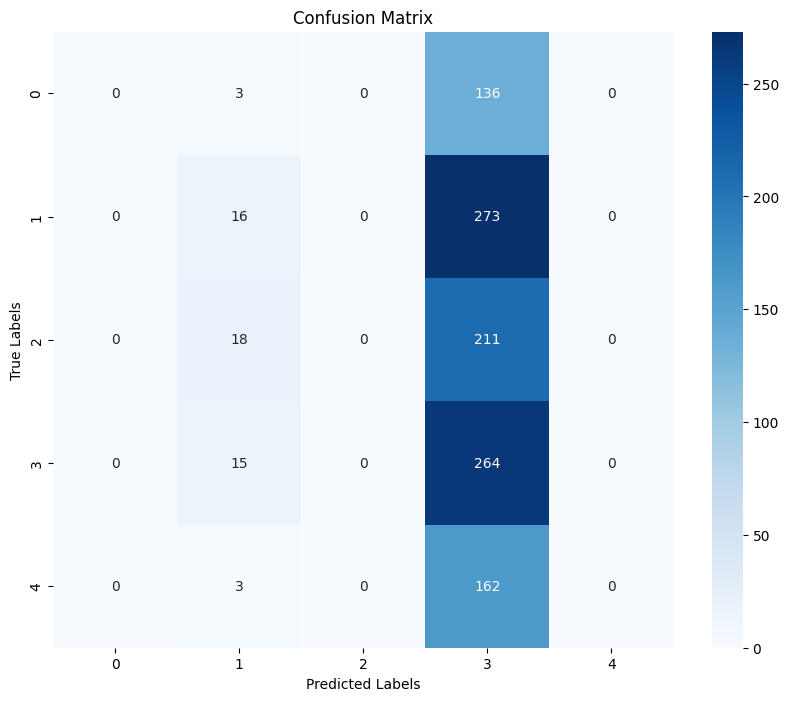

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=range(len(set(labels))), yticklabels=range(len(set(labels))))
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()


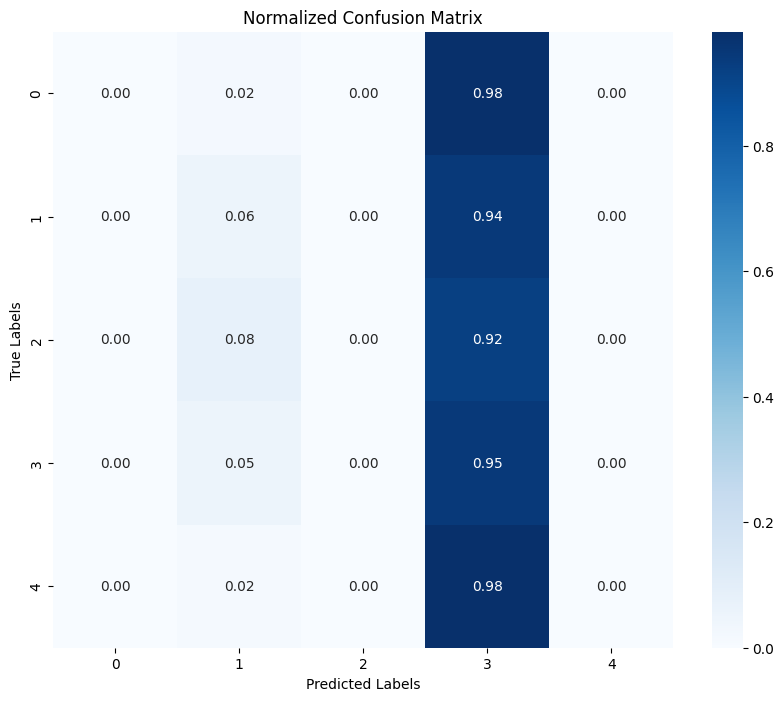

In [0]:
# Normalize the confusion matrix
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

# Plot the normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_normalized, annot=True, fmt=".2f", cmap="Blues", xticklabels=range(len(set(labels))), yticklabels=range(len(set(labels))))
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Normalized Confusion Matrix")
plt.show()

In [0]:
# define list of examples
text_list = ["Absolutely love this bottle! Keeps my water cold all day. Very eco-friendly.", 
             "resourceful and ingenious entertainment nice.", 
             "Battery life is good, but the noise canceling could be better.", 
             "Absolutely delicious! The best coffee I've ever had.",
             "Works well for tracking steps but not great for detailed workouts.", 
             "Smells amazing and absorbs quickly into the skin.",
             "Sound quality is top-notch! Better than my old earbuds",
             "Too bitter for my taste. Not as fresh as I expected.very bad",
             "Did not work for me. Caused irritation."
             ]

for text in text_list:
    text = clean_pipeline(text)
    # tokenize text
    inputs = tokenizer.encode(text, return_tensors="pt")
    # compute logits
    logits = model2(inputs).logits
    # convert logits to label
    predictions = torch.argmax(logits)

    print(text + " - " + str(predictions.tolist()))

absolutely love bottle keep water cold day eco friendly - 3
resourceful ingenious entertainment nice - 3
battery life good noise canceling could better - 3
absolutely delicious best coffee ever - 3
work well tracking step great detailed workout - 3
smell amazing absorbs quickly skin - 3
sound quality top notch better old earbuds - 3
bitter taste fresh expected bad - 1
work caused irritation - 3


## Fine tuning Distilbert Base using SST5 ground truth dataset

In [0]:
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')


tokenized_sst5 = sst5.map(tokenize_function, batched=True)
tokenized_sst5.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])

In [0]:
# Load a smaller, faster model
sentiment_model1 = DistilBertForSequenceClassification.from_pretrained('distilbert-base-uncased', num_labels=5)
output_dir1 = '/dbfs/tmp/sentiment_model_results'
logging_dir1 = '/dbfs/tmp/sentiment_model_logs'
# Configure training arguments for faster training
training_args1 = TrainingArguments(
    output_dir=output_dir1,
    eval_strategy="epoch",
    num_train_epochs=3,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    gradient_accumulation_steps=2,
    fp16=True,
    logging_dir=logging_dir1,
)

# Fine-tune the model
trainer1 = Trainer(
    model=sentiment_model1,
    args=training_args,
    train_dataset=tokenized_sst5['train'],
    eval_dataset=tokenized_sst5["validation"],
    tokenizer=tokenizer,
    compute_metrics=compute_metrics
)
trainer1.train()

sentiment_model1_save_path = "/dbfs/tmp/sentiment_model1"
sentiment_model1.save_pretrained(sentiment_model1_save_path)
tokenizer.save_pretrained(sentiment_model1_save_path)

s3_save_path_model1 = "s3://databricks-workspace-stack-6efc1-bucket/sentiment_model1"
sentiment_model1.save_pretrained(s3_save_path_model1)
tokenizer.save_pretrained(s3_save_path_model1)

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy
1,1.239500,1.172145,{'accuracy': 0.49591280653950953}
2,0.926700,1.192881,{'accuracy': 0.5031789282470481}
3,0.664300,1.377527,{'accuracy': 0.4940962761126249}


Trainer is attempting to log a value of "{'accuracy': 0.49591280653950953}" of type <class 'dict'> for key "eval_accuracy" as a metric. MLflow's log_metric() only accepts float and int types so we dropped this attribute.
Trainer is attempting to log a value of "{'accuracy': 0.49591280653950953}" of type <class 'dict'> for key "eval/accuracy" as a scalar. This invocation of Tensorboard's writer.add_scalar() is incorrect so we dropped this attribute.
Trainer is attempting to log a value of "{'accuracy': 0.5031789282470481}" of type <class 'dict'> for key "eval_accuracy" as a metric. MLflow's log_metric() only accepts float and int types so we dropped this attribute.
Trainer is attempting to log a value of "{'accuracy': 0.5031789282470481}" of type <class 'dict'> for key "eval/accuracy" as a scalar. This invocation of Tensorboard's writer.add_scalar() is incorrect so we dropped this attribute.
Trainer is attempting to log a value of "{'accuracy': 0.4940962761126249}" of type <class 'dict'

('s3://databricks-workspace-stack-6efc1-bucket/sentiment_model1/tokenizer_config.json',
 's3://databricks-workspace-stack-6efc1-bucket/sentiment_model1/special_tokens_map.json',
 's3://databricks-workspace-stack-6efc1-bucket/sentiment_model1/vocab.txt',
 's3://databricks-workspace-stack-6efc1-bucket/sentiment_model1/added_tokens.json')

In [0]:
# Specify the directory to save the trainer and its components
trainer1_save_directory = "/dbfs/tmp/sentiment_model1_trainer"
# Save the model, tokenizer, and training arguments
trainer1.save_model(trainer1_save_directory)
s3_trainer_save_path1 = "s3://databricks-workspace-stack-6efc1-bucket/sentiment_model1_trainer"
trainer1.save_model(s3_trainer_save_path1)

# Save the training arguments
torch.save(training_args, f"{trainer1_save_directory}/training_args.bin")

In [0]:
# Evaluate the model after training
result1 = trainer1.evaluate(eval_dataset=tokenized_sst5["validation"])

print(f"Results: {result1}")

Trainer is attempting to log a value of "{'accuracy': 0.4940962761126249}" of type <class 'dict'> for key "eval_accuracy" as a metric. MLflow's log_metric() only accepts float and int types so we dropped this attribute.
Trainer is attempting to log a value of "{'accuracy': 0.4940962761126249}" of type <class 'dict'> for key "eval/accuracy" as a scalar. This invocation of Tensorboard's writer.add_scalar() is incorrect so we dropped this attribute.


Results: {'eval_loss': 1.3775272369384766, 'eval_accuracy': {'accuracy': 0.4940962761126249}, 'eval_runtime': 454.7427, 'eval_samples_per_second': 2.421, 'eval_steps_per_second': 0.303, 'epoch': 3.0}


In [0]:
# Display the results
import pandas as pd
display(pd.DataFrame([result1]))

eval_loss,eval_accuracy,eval_runtime,eval_samples_per_second,eval_steps_per_second,epoch
1.3775272369384766,List(0.4940962761126249),454.7427,2.421,0.303,3.0


In [0]:
import json

# Save results to a JSON file
results1_path = "/dbfs/tmp/sentiment_model1/evaluation_results.json"
results1_s3_path = "s3://databricks-workspace-stack-6efc1-bucket/sentiment_model1_evaluation_results.json"
with open(results1_path, "w") as f:
    json.dump(result1, f)
with open(results1_s3_path, "w") as f:
    json.dump(result1, f)

print(f"Results saved to {results1_path}")
print(f"Results saved to {results1_s3_path}")

Results saved to /dbfs/tmp/sentiment_model1/evaluation_results.json
Results saved to s3://databricks-workspace-stack-6efc1-bucket/sentiment_model1_evaluation_results.json


In [0]:
# Test the model on testing data
predictions1 = trainer1.predict(tokenized_sst5["test"])

# Extract results
logits1 = predictions1.predictions
labels1 = predictions1.label_ids
metrics1 = predictions1.metrics

# Convert logits to predicted classes
predicted1_classes = np.argmax(logits1, axis=1)

# Print test metrics
print(f"Test Metrics: {metrics1}")

# Calculate accuracy (if not already in metrics)
accuracy1 = (predicted1_classes == labels1).mean()
print(f"Test Accuracy: {accuracy1}")

# Save predictions and true labels to a CSV
import pandas as pd
results1_df = pd.DataFrame({
    "true_label": labels1,
    "predicted_label": predicted1_classes
})
results1_df.to_csv("/dbfs/tmp/test1_results.csv", index=False)
print("Test results saved to /dbfs/tmp/test1_results.csv")
display(results1_df)

Test Metrics: {'test_loss': 1.2582894563674927, 'test_accuracy': {'accuracy': 0.5230769230769231}, 'test_runtime': 902.8264, 'test_samples_per_second': 2.448, 'test_steps_per_second': 0.307}
Test Accuracy: 0.5230769230769231
Test results saved to /dbfs/tmp/test1_results.csv


true_label,predicted_label
1,1
0,0
2,2
2,3
0,0
0,1
4,4
3,4
1,2
3,4


In [0]:
# Obtain predictions and true labels
predictions1_output = trainer1.predict(tokenized_sst5["validation"])


# Extract logits and labels
logits1 = predictions1_output.predictions
labels1 = predictions1_output.label_ids

In [0]:
import numpy as np
# Convert logits to predicted class labels
predicted1_labels = np.argmax(logits1, axis=1)

In [0]:
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score

# Precision, Recall, F1-Score
precision, recall, f1, _ = precision_recall_fscore_support(
    labels1, predicted1_labels, average="weighted"
)

# ROC-AUC (applicable for binary or multi-class classification)
try:
    roc_auc = roc_auc_score(labels1, logits1, multi_class="ovo")
except ValueError:
    roc_auc = None  # ROC-AUC not applicable for some cases

# Print results
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")
if roc_auc is not None:
    print(f"ROC-AUC: {roc_auc:.4f}")
else:
    print("ROC-AUC: Not applicable for this task.")


Precision: 0.4948
Recall: 0.4941
F1-Score: 0.4930
ROC-AUC: Not applicable for this task.


In [0]:
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score
from scipy.special import softmax
import numpy as np

# Obtain predictions and true labels from the trainer
predictions1_output = trainer1.predict(tokenized_sst5["validation"])

# Extract logits and labels
logits1 = predictions1_output.predictions
labels1 = predictions1_output.label_ids

# Convert logits to class predictions
predicted1_labels = np.argmax(logits1, axis=1)

# Calculate Precision, Recall, F1-Score
precision, recall, f1, _ = precision_recall_fscore_support(
    labels1, predicted1_labels, average="weighted"
)

# Print the classification metrics
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")

# Calculate ROC-AUC
try:
    if logits1.shape[1] == 2:  # Binary classification
        # Apply softmax to logits to get probabilities
        probs = softmax(logits1, axis=1)
        roc_auc = roc_auc_score(labels1, probs[:, 1])  # Use probabilities for the positive class
    else:  # Multi-class classification
        roc_auc = roc_auc_score(labels1, logits1, multi_class="ovr")  # One-vs-Rest
    print(f"ROC-AUC: {roc_auc:.4f}")
except ValueError as e:
    print(f"ROC-AUC not applicable: {e}")

# Save evaluation metrics for reference
results1 = {
    "Precision": precision,
    "Recall": recall,
    "F1-Score": f1,
    "ROC-AUC": roc_auc if 'roc_auc' in locals() else "Not Applicable"
}

# Save results to a file
import json
with open("evaluation_results.json", "w") as f:
    json.dump(results1, f, indent=4)

display(results1)

Precision: 0.4948
Recall: 0.4941
F1-Score: 0.4930
ROC-AUC not applicable: Target scores need to be probabilities for multiclass roc_auc, i.e. they should sum up to 1.0 over classes


{'Precision': 0.4948113802544093,
 'Recall': 0.4940962761126249,
 'F1-Score': 0.49302868219851703,
 'ROC-AUC': None}

In [0]:
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score ,confusion_matrix
import numpy as np

# Obtain predictions and true labels
predictions1_output = trainer1.predict(tokenized_sst5["validation"])


# Extract logits and labels
logits1 = predictions1_output.predictions
labels1 = predictions1_output.label_ids

# Convert logits to predicted class labels
predicted1_labels = np.argmax(logits1, axis=1)

# Precision, Recall, F1-Score
precision, recall, f1, _ = precision_recall_fscore_support(
    labels1, predicted1_labels, average="weighted"
)

# ROC-AUC (applicable for binary or multi-class classification)
try:
    roc_auc = roc_auc_score(labels1, logits1, multi_class="ovo")
except ValueError:
    roc_auc = None  # ROC-AUC not applicable for some cases



# Compute confusion matrix
conf_matrix = confusion_matrix(labels1, predicted1_labels)


# Print results
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}") 
print("Confusion Matrix:")
print(conf_matrix)
if roc_auc is not None:
    print(f"ROC-AUC: {roc_auc:.4f}")
else:
    print("ROC-AUC: Not applicable for this task.")

Precision: 0.4948
Recall: 0.4941
F1-Score: 0.4930
Confusion Matrix:
[[ 58  62  17   2   0]
 [ 50 157  63  19   0]
 [  5  56  89  67  12]
 [  2   6  49 161  61]
 [  0   1  10  75  79]]
ROC-AUC: Not applicable for this task.


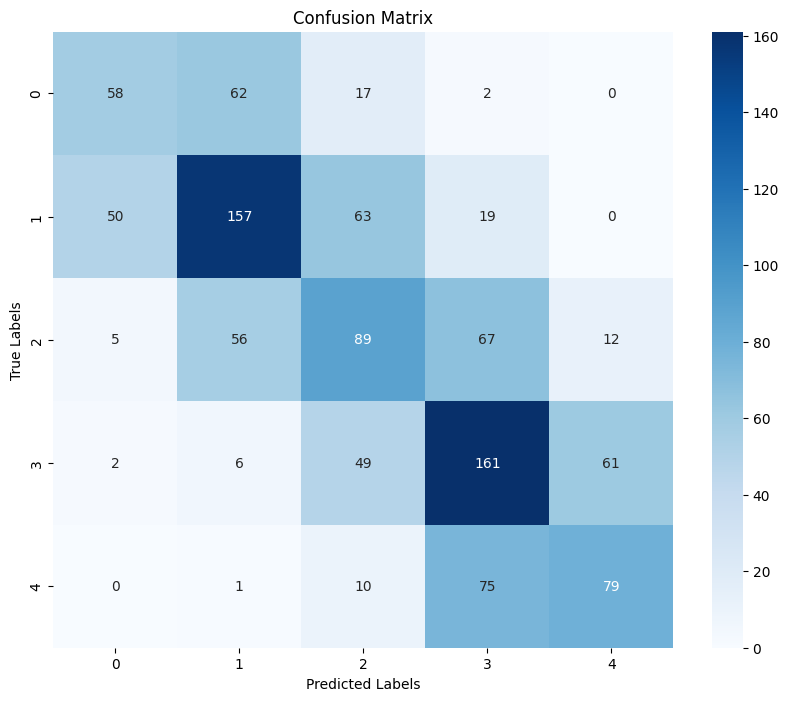

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=range(len(set(labels1))), yticklabels=range(len(set(labels1))))
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

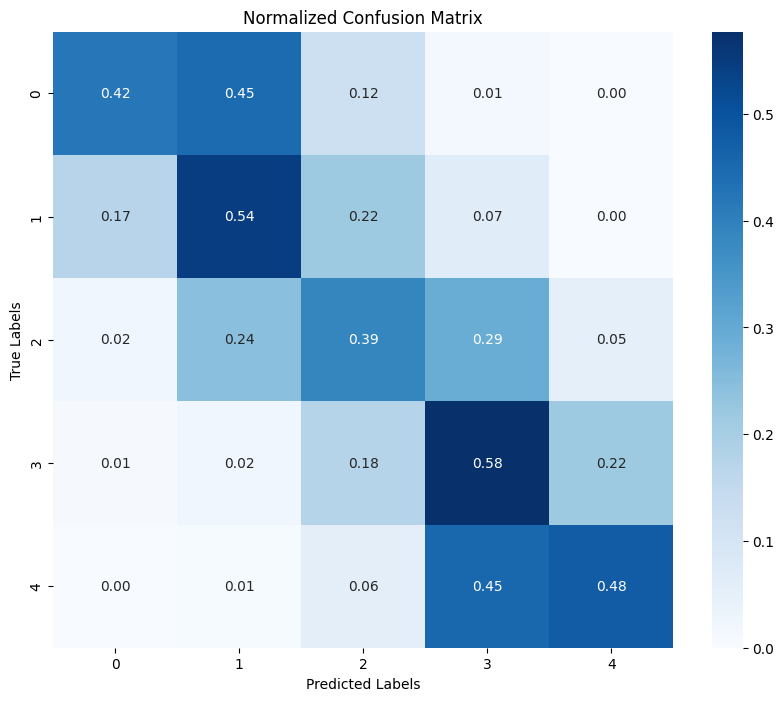

In [0]:
# Normalize the confusion matrix
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

# Plot the normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_normalized, annot=True, fmt=".2f", cmap="Blues", xticklabels=range(len(set(labels1))), yticklabels=range(len(set(labels1))))
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Normalized Confusion Matrix")
plt.show()

In [0]:
# define list of examples
text_list = ["Absolutely love this bottle! Keeps my water cold all day. Very eco-friendly.", 
             "resourceful and ingenious entertainment nice.", 
             "Battery life is good, but the noise canceling could be better.", 
             "Absolutely delicious! The best coffee I've ever had.",
             "Works well for tracking steps but not great for detailed workouts.", 
             "Smells amazing and absorbs quickly into the skin.",
             "Sound quality is top-notch! Better than my old earbuds",
             "Too bitter for my taste. Not as fresh as I expected.very bad",
             "Did not work for me. Caused irritation."
             ]

for text in text_list:
    text = clean_pipeline(text)
    # tokenize text
    inputs = tokenizer.encode(text, return_tensors="pt")
    # compute logits
    logits = sentiment_model1(inputs).logits
    # convert logits to label
    predictions = torch.argmax(logits)

    print(text + " - " + str(predictions.tolist()))

absolutely love bottle keep water cold day eco friendly - 3
resourceful ingenious entertainment nice - 4
battery life good noise canceling could better - 2
absolutely delicious best coffee ever - 4
work well tracking step great detailed workout - 3
smell amazing absorbs quickly skin - 3
sound quality top notch better old earbuds - 3
bitter taste fresh expected bad - 1
work caused irritation - 1


#### Product Embeddings Enhancement with Sentiment Scores

In [0]:
%python
# Download the 'punkt' resource from NLTK
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [0]:
# define list of examples
text_list = ["Absolutely love this bottle! Keeps my water cold all day. Very eco-friendly.", 
             "resourceful and ingenious entertainment nice.", 
             "Battery life is good, but the noise canceling could be better.", 
             "Absolutely delicious! The best coffee I've ever had.",
             "Works well for tracking steps but not great for detailed workouts.", 
             "Smells amazing and absorbs quickly into the skin.",
             "Sound quality is top-notch! Better than my old earbuds",
             "Too bitter for my taste. Not as fresh as I expected.very bad",
             "Did not work for me. Caused irritation."
             ]

for text in text_list:
    text = clean_pipeline(text)
    # tokenize text
    inputs = tokenizer.encode(text, return_tensors="pt")
    # compute logits
    logits = model2(inputs).logits
    # convert logits to label
    predictions = torch.argmax(logits)

    print(text + " - " + str(predictions.tolist()))

absolutely love bottle keep water cold day eco friendly - 3
resourceful ingenious entertainment nice - 3
battery life good noise canceling could better - 3
absolutely delicious best coffee ever - 3
work well tracking step great detailed workout - 3
smell amazing absorbs quickly skin - 3
sound quality top notch better old earbuds - 3
bitter taste fresh expected bad - 1
work caused irritation - 3


In [0]:

s3_model_path = "s3://databricks-workspace-stack-6efc1-bucket/sentiment_model"

device = "cuda" if torch.cuda.is_available() else "cpu"  # Check for GPU
tokenizer = AutoTokenizer.from_pretrained(s3_model_path)
sentiment_model = AutoModelForSequenceClassification.from_pretrained(s3_model_path).to(device)


# Function to classify sentiment of a product review
def classify_review_sentiment(review_text):
    inputs = tokenizer(review_text, return_tensors="pt", padding="max_length", truncation=True)
    outputs = sentiment_model(**inputs)
    sentiment_score = torch.argmax(outputs.logits, dim=1).item()  # Returns sentiment label (0-4)
    return sentiment_score


# Improved with classify with batched
def classify_reviews_in_batch(review_texts, batch_size=8):
    sentiments = []
    for i in range(0, len(review_texts), batch_size):
        batch_texts = review_texts[i:i + batch_size]
        inputs = tokenizer(batch_texts, return_tensors="pt", padding='longest', truncation=True).to(device)
        with torch.no_grad():
            outputs = sentiment_model(**inputs)
        sentiment_scores = torch.argmax(outputs.logits, dim=1).tolist()
        sentiments.extend(sentiment_scores)
        print(f"Processed batch {i // batch_size + 1}: {sentiment_scores}")
    return sentiments
  
# classify and concatenate each product embedding with its sentiment score
def enhance_embeddings(product_embeddings_df, reviews_df):
    # Calculate sentiment for each review and add as a column in DataFrame
    sentiments = reviews_df.rdd.map(lambda row: (row['parent_asin'], row['review_text'], classify_reviews_in_batch(row['review_text'])))

    sentiment_df = sentiments.toDF(["parent_asin", "review_text", "sentiment_score"])
    sentiment_df = sentiment_df.select("parent_asin", "review_text", explode("sentiment_score").alias("sentiment_score"))

    # Aggregate sentiment scores by product (calculate average sentiment)
    aggregated_sentiment_df = sentiment_df.groupBy("parent_asin").agg(avg("sentiment_score").alias("avg_sentiment_score"))

    # Join product embeddings with the aggregated sentiment scores
    enhanced_df = product_embeddings_df.join(aggregated_sentiment_df, on="parent_asin")

    return enhanced_df

# Invoke enhancing
reviews = spark.table('llm_sentiment_recommender.reviews')
reviews_df = reviews[["parent_asin",'review_text']]
subset_df = reviews_df.limit(100)
product_embeddings_df = spark.table('product_metadata_embeddings')
# Enhance embeddings with sentiment scores
enhanced_embeddings = enhance_embeddings(product_embeddings_df, subset_df)

enhanced_embeddings.write.format("delta").mode("overwrite").saveAsTable("product_enhanced_embeddings")

In [0]:
from pyspark.sql.functions import col, avg, explode
from pyspark.sql import Row
 # Load model and tokenizer in each worker
s3_model_path = "s3://databricks-workspace-stack-6efc1-bucket/sentiment_model1"
device = "cuda" if torch.cuda.is_available() else "cpu"
tokenizer = AutoTokenizer.from_pretrained(s3_model_path)
sentiment_model = sentiment_model1
# Function to classify reviews in a batch within a partition
def classify_reviews_in_partition(partition):
    results = []
    for row in partition:
        # batch_texts = [clean_pipeline(row['review_text']) for row in row] #reviews["Review_text"].apply(clean_pipeline)
        batch_texts =  [clean_pipeline(row['review_text'])]
        inputs = tokenizer(batch_texts, return_tensors="pt", padding='longest', truncation=True).to(device)
        with torch.no_grad():
            outputs = sentiment_model(**inputs)
        sentiment_scores = torch.argmax(outputs.logits, dim=1).tolist()
        results.append((row['parent_asin'], row['review_text'], sentiment_scores[0]))
    return results

# Enhanced embeddings with mapPartitions
def enhance_embeddings_with_partitions(product_embeddings_df, reviews_df):
    # Map partitions to process sentiment classification in batches
    sentiment_rdd = reviews_df.rdd.mapPartitions(classify_reviews_in_partition)

    # Convert RDD back to DataFrame
    sentiment_df = sentiment_rdd.toDF(["parent_asin", "review_text", "sentiment_score"])

    # Aggregate sentiment scores by product (calculate average sentiment)
    aggregated_sentiment_df = sentiment_df.groupBy("parent_asin").agg(avg("sentiment_score").alias("avg_sentiment_score"))

    # Join product embeddings with the aggregated sentiment scores
    enhanced_df = product_embeddings_df.join(aggregated_sentiment_df, on="parent_asin")

    return enhanced_df

# Invoke enhancing
reviews = spark.table('llm_sentiment_recommender.reviews')
reviews_df = reviews.select("parent_asin", "review_text")
subset_df = reviews_df.limit(300000)
product_embeddings_df = spark.table('product_metadata_embeddings')

# Enhance embeddings with sentiment scores using mapPartitions
enhanced_embeddings = enhance_embeddings_with_partitions(product_embeddings_df, reviews_df)

# Save the enhanced embeddings
enhanced_embeddings.write.format("delta").mode("overwrite").saveAsTable("product_enhanced_embeddings_full")


In [0]:
product_embeddings_df = spark.table('product_metadata_embeddings')
product_embeddings_df.columns

['parent_asin', 'product_text', 'embedding']

In [0]:
display(enhanced_embeddings)

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$5(SequenceExecutionState.scala:136)
	at scala.Option.getOrElse(Option.scala:189)
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$3(SequenceExecutionState.scala:136)
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$3$adapted(SequenceExecutionState.scala:133)
	at scala.collection.immutable.Range.foreach(Range.scala:158)
	at com.databricks.spark.chauffeur.SequenceExecutionState.cancel(SequenceExecutionState.scala:133)
	at com.databricks.spark.chauffeur.ExecContextState.cancelRunningSequence(ExecContextState.scala:728)
	at com.databricks.spark.chauffeur.ExecContextState.$anonfun$cancel$1(ExecContextState.scala:446)
	at scala.Option.getOrElse(Option.scala:189)
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:446)
	at com.databricks.spark.chauffeur.ExecutionContextManagerV1.can

In [0]:
enhance_embeddings = spark.table('llm_sentiment_recommender.product_enhanced_embeddings_full')

enhance_embeddings.count()

112565

In [0]:
enhance_embeddings.show()

+-----------+--------------------+--------------------+-------------------+
|parent_asin|        product_text|           embedding|avg_sentiment_score|
+-----------+--------------------+--------------------+-------------------+
| B073V7X8BB|{'title': "Hope &...|[0.00481446040794...| 1.6666666666666667|
| B005XDSJPC|{'title': '**Disc...|[-0.0327429324388...|                3.0|
| B085NLHH39|{'title': 'Undera...|[-0.0752143785357...| 1.6666666666666667|
| B0888J4X5K|{'title': "WDNMD ...|[-0.1284103244543...|                2.5|
| B088FMNM89|{'title': 'EASACE...|[-0.0400606356561...|                1.0|
| B00C0W5WJU|{'title': 'Destin...|[-0.0126211959868...|                3.0|
| B08JB4STFS|{'title': 'fani 3...|[-0.0159903950989...| 2.4285714285714284|
| B07G9DGY3G|{'title': 'Norelc...|[-0.0336175449192...|                1.0|
| B0753XDV6L|{'title': 'Ariul ...|[-0.0574864558875...| 2.1818181818181817|
| B00HUG1C7M|{'title': 'Ruelal...|[-0.0127350967377...|                2.0|
| B07MMWXPLJ

In [0]:
# drop column "product_text in enhanced_embeddings before join to avoind ambigiuty"
enhanced_embeddings = enhance_embeddings.drop("product_text")
product_data = products.drop("avg_sentiment_score")
enhanced_sentiment_products = product_data.join(enhanced_embeddings, on="parent_asin", how="left")


display(enhanced_sentiment_products)

parent_asin id main_category title average_rating rating_number features description price store categories details bought_together subtitle author product_text embedding avg_sentiment_score 0005946468 61369 All Beauty Patanjali Moisturizer Cream - Pack of 2 5.0 2 [] [] None patanjali [] {"Brand": "Patanjali", "Item Form": "Cream", "Unit Count": "1 Count", "Number of Items": "2", "Use for": "Face", "Package Dimensions": "6.61 x 2.8 x 2.2 inches; 1.76 Ounces"} None None None {'title': 'Patanjali Moisturizer Cream - Pack of 2', 'main_category': 'All Beauty', 'description': '', 'categories': '', 'features': '', 'parent_asin': '0005946468'} List(-0.01781294494867325, 0.040626514703035355, -0.007273524068295956, 0.04146251082420349, -0.023003840819001198, 0.003651625709608197, 0.03263618052005768, -0.008950510993599892, -0.02784731052815914, -0.10589227825403214, 0.091132253408432, -0.10324668139219284, -0.03262889012694359, -0.01292417198419571, 0.04870087280869484, 0.08310983330011368, -0.022826293483376503, 0.021916773170232773, -0.01775907352566719, -0.09863597899675369, 0.03647558018565178, 0.09042681008577347, 0.08118588477373123, -0.013088107109069824, 0.005364245735108852, 0.05936067923903465, -0.04327699542045593, -0.07623633742332458, 0.015368337742984295, -0.052645791321992874, 0.01670781709253788, 0.02919466607272625, 0.07956147193908691, 0.0649542585015297, 0.019740480929613113, 0.03820079565048218, -0.013956707902252674, -0.03840629756450653, 0.06939762830734253, 0.0502789132297039, -0.007608938962221146, -0.022877495735883713, -0.08446761965751648, -0.0548320896923542, 0.019053785130381584, -0.01268216036260128, 0.0036810527089983225, 0.0012832584325224161, 0.009453658945858479, 0.02759697660803795, -0.07511432468891144, -0.1178249716758728, -0.0689399242401123, 0.023239009082317352, -2.55396356806159E-4, -0.03109528124332428, -0.08184707164764404, -0.061936456710100174, -0.057115670293569565, 0.01680869422852993, 0.06014975160360336, 0.006850090343505144, -0.06242811307311058, 0.05089792236685753, -0.026741759851574898, -0.062153831124305725, -0.023319730535149574, 0.011641339398920536, 0.08114295452833176, -0.04390041530132294, -0.03290197253227234, 0.011842702515423298, 0.027411021292209625, 0.0472840815782547, -0.03152800723910332, -0.038146261125802994, 0.02753562293946743, -0.03632468357682228, 0.01440198253840208, -0.051423050463199615, -0.007023126818239689, -0.006146133411675692, 0.06996270269155502, 0.09842424839735031, -0.03440942242741585, -0.0011244775960221887, 0.01656358502805233, -0.01046027708798647, -0.09082084149122238, -0.05743826925754547, -0.026180777698755264, -0.04403339698910713, 0.04770359769463539, 0.05127803981304169, -0.09103412181138992, 0.02178926207125187, 0.04270724579691887, -0.07934058457612991, -0.04266511648893356, 0.1009884923696518, -0.03851449117064476, -0.04434599727392197, 0.027597175911068916, -0.00794614665210247, -0.09248539060354233, -0.05081765726208687, -0.06204470619559288, -0.02277318388223648, 3.7996721221134067E-4, 0.021192872896790504, -0.04413589462637901, -0.004106521140784025, -0.10144377499818802, -0.09719231724739075, -0.07225798070430756, -0.04892357066273689, -0.053217340260744095, 0.016829073429107666, 0.08090008050203323, 0.0014699599705636501, -0.006409882102161646, -0.02916773408651352, 0.008684621192514896, -0.026797480881214142, -0.08897070586681366, -0.027179008349776268, -0.043597765266895294, -5.495574417310282E-35, 0.018768319860100746, 0.013906286098062992, -0.013295415788888931, 0.013175318948924541, 0.01361009944230318, -0.02259981818497181, -7.49870901927352E-4, -0.01410688553005457, -0.0662696585059166, -0.006933189462870359, -0.0092872753739357, -0.008462628349661827, -0.11297162622213364, 0.10766182839870453, 0.03885338827967644, -0.042160019278526306, 0.04557591304183006, 0.024792762473225594, 0.09148064255714417, -0.05450039356946945, -0.051438428461551666, 0.09771467745304108, -0.06575371325016022, 0.042734209448099136, -0.057453162968158

In [0]:
enhanced_sentiment_products.write.format("delta").mode("overwrite").saveAsTable("products_with_scores")

In [0]:
enhanced_embeddings_selected = np.array(enhanced_embeddings.select("embedding").rdd.flatMap(lambda x: x).collect())
dimension = len(enhanced_embeddings_selected)


com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$5(SequenceExecutionState.scala:136)
	at scala.Option.getOrElse(Option.scala:189)
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$3(SequenceExecutionState.scala:136)
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$3$adapted(SequenceExecutionState.scala:133)
	at scala.collection.immutable.Range.foreach(Range.scala:158)
	at com.databricks.spark.chauffeur.SequenceExecutionState.cancel(SequenceExecutionState.scala:133)
	at com.databricks.spark.chauffeur.ExecContextState.cancelRunningSequence(ExecContextState.scala:728)
	at com.databricks.spark.chauffeur.ExecContextState.$anonfun$cancel$1(ExecContextState.scala:446)
	at scala.Option.getOrElse(Option.scala:189)
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:446)
	at com.databricks.spark.chauffeur.ExecutionContextManagerV1.can

In [0]:

enhanced_embeddings_selected = np.array(enhance_embeddings.select("embedding").rdd.flatMap(lambda x: x).collect())

# Build FAISS index
index = faiss.IndexFlatL2(enhanced_embeddings_selected.shape[1])
index.add(enhanced_embeddings_selected)

# Verify FAISS index size
print("FAISS index size:", index.ntotal)

# Save locally on Databricks
faiss_index_path = "/dbfs/tmp/faiss_index.index"  # Local DBFS path

# Save the FAISS index
faiss.write_index(index, faiss_index_path)


FAISS index size: 112565


In [0]:
faiss_index_path = "/dbfs/tmp/faiss_index.index"
index = faiss.read_index(faiss_index_path)
display(index)

<faiss.swigfaiss_avx2.IndexFlatL2; proxy of <Swig Object of type 'faiss::IndexFlatL2 *' at 0x7f4aac8d8450> >

## Recommender Enpoint Functions

In [0]:
gpt4all_url = config['gpt4all_endpoint']
# Function to generate general product recommendations using GPT-4ALL
# You are an AI assistant functioning as a recommendation system for an e-commerce website specializing in beauty and personal care products. The dataset contains product categories such as skincare, haircare, and grooming items, with detailed descriptions and user reviews. Recommend 5 products likely to appeal to a customer who has purchased the following items: Leather Conditioner, Skin Moisturizer, and Organic Hair Growth Serum. Ensure the recommendations are diverse but relevant, spanning complementary beauty or personal care items. Express your response as a JSON object with an array of 'next_items', where each item includes:
# 'name': The product name. 'category': The product category (e.g., skincare, haircare, grooming). 'description': A short description of the product.
def get_general_products_gpt4all(items):
    system_prompt = 'You are an AI assistant functioning as a recommendation system for an e-commerce website specializing in beauty and personal care products. The dataset contains product categories such as skincare, haircare, and grooming items, with detailed descriptions and user reviews.Be specific and limit your answers to the requested format.'
    items_delimited = ', '.join(items[:-1]) + ', and ' + items[-1] if len(items) > 1 else items[0]
    
    user_prompt = f"Recommend 5 products likely to appeal to a customer who has purchased the following items:{items_delimited}.Ensure the recommendations are diverse but relevant, spanning complementary beauty or personal care items. Express your response as a JSON object with an array of 'next_items',where each item includes:# 'title': The product name. 'category': The product category (e.g., skincare, haircare, grooming). 'description': A short description of the product. Do not include product id."
    full_prompt = f"{system_prompt}\n{user_prompt}"

    prompt_data = {
        "model": "gpt4all-llama-3-8B-instruct",
        "messages": [{"role": "user", "content": full_prompt}],
        "max_tokens": 5000
    }
    
    try:
        with requests.post(gpt4all_url, json=prompt_data, stream=True) as response:
            response.raise_for_status()
            full_response = ''.join(chunk.decode() for chunk in response.iter_content(chunk_size=8192))
        json_response = json.loads(full_response)
        message_content = json_response.get('choices', [])[0].get('message', {}).get('content', '')
        json_match = re.search(r'```\n(.*?)\n```', message_content, re.DOTALL)
        if json_match:
            parsed_content = json.loads(json_match.group(1))
            return parsed_content.get('next_items', [])
        return []
    except requests.exceptions.RequestException as e:
        print(f"Error making the request: {e}")
        return []

In [0]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
s3_model_path = "s3://databricks-workspace-stack-6efc1-bucket/sentiment_model1"
faiss_index_path = "/dbfs/tmp/faiss_index.index"
tokenizer = AutoTokenizer.from_pretrained(s3_model_path)
# sentiment_model = AutoModelForSequenceClassification.from_pretrained(s3_model_path)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
embedding_model = SentenceTransformer('all-MiniLM-L6-v2', device=device)

products_with_scores = spark.table('llm_sentiment_recommender.products_with_scores')


# Function to perform similarity search using FAISS with sentiment-enhanced embeddings
def get_specific_products_with_sentiment(general_items, num_items):
    item_texts = [f"{item['title']} {item['category']} {item['description']}" for item in general_items]
    general_item_embeddings = embedding_model.encode(item_texts)

    print("index dimesnion",general_item_embeddings)
    # Load the FAISS index
    index = faiss.read_index(faiss_index_path)

    print(index)

    # Perform the FAISS search
    D, I = index.search(np.array(general_item_embeddings), num_items)

    # Step 5: Retrieve product data based on indices
    product_data = products_with_scores.select("parent_asin","title","description","product_text","avg_sentiment_score").collect()
    product_texts = [row['product_text'] for row in product_data]
    parent_asins = [row['parent_asin'] for row in product_data]
    descriptions = [row['description'] for row in product_data]
    titles = [row['title'] for row in product_data]
    scores = [row['avg_sentiment_score'] for row in product_data]

    # Step 6: Format the results
    similar_products = []
    for indices in I:
        products = [{"parent_asin": parent_asins[i], "title": titles[i],"description": descriptions[i],"score": scores[i]} for i in indices]
        similar_products.append(products)
    
    return similar_products

/databricks/python/lib/python3.11/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [0]:
from pyspark.sql.functions import desc
from pyspark.sql import functions as F


# Function to perform similarity search using FAISS with sentiment-enhanced embeddings
def get_specific_products_with_sentiment(general_items, num_items):
    """
    Retrieve top products based on similarity search using FAISS and avg_sentiment_score.
    """
    # Generate embeddings for the general items
    item_texts = [f"{item['title']} {item['category']} {item['description']}" for item in general_items]
    general_item_embeddings = embedding_model.encode(item_texts)

    print("Embedding dimensions:", general_item_embeddings.shape)

    # Load the FAISS index
    index = faiss.read_index(faiss_index_path)
    print(index)

    # Perform the FAISS search
    D, I = index.search(np.array(general_item_embeddings), 30)

    # Retrieve product data from products_with_scores table
    product_data = products_with_scores.select("parent_asin", "title", "description", "product_text", "avg_sentiment_score")

    # Filter products that are in the FAISS indices
    product_data = product_data.withColumn("row_index", F.monotonically_increasing_id())  # Add row index for filtering
    product_indices = [i for index_set in I for i in index_set]  # Flatten the FAISS result indices
    product_indices_broadcast = spark.sparkContext.broadcast(set(product_indices))  # Broadcast for performance

    filtered_products = product_data.filter(F.col("row_index").isin(product_indices_broadcast.value))
    
    # Sort products by avg_sentiment_score in descending order and retrieve the top n
    top_products = filtered_products.orderBy(desc("avg_sentiment_score")).limit(num_items)

    # Collect top products into a list of dictionaries
    top_products_list = top_products.collect()
    result = [
        {
            "parent_asin": row["parent_asin"],
            "title": row["title"],
            "score": row["avg_sentiment_score"]
        }
        for row in top_products_list
    ]

    return result


In [0]:
# Import libraries
from pyspark.sql.functions import col
import json

def recommend(items):
    # Get general product recommendations (LLM Prompt)
    items = ['Human hair','Toothbrush','Facial Cream','Eye Lashes']
    general_items = get_general_products_gpt4all(items)
    print("LLM general recommendations", general_items)
    # Get specific product recommendations using FAISS search and sentiment-enhanced embeddings
    specific_products = get_specific_products_with_sentiment(general_items, 10)
    print("Recommender Specific items",specific_products)

    response = {
        "specific_recommendations": specific_products,
    }

    # print("final response",response)
    print(json.dumps(response, indent=4))
    return response

# Databricks job entry point
dbutils.widgets.text("items", "['Human hair','Toothbrush','Facial Cream','Eye Lashes']")  # Input items
dbutils.widgets.text("true_items", "[]")  # Input true items
# Read inputs
items = json.loads(dbutils.widgets.get("items"))


items = ['Human hair','Toothbrush','Facial Cream','Eye Lashes']
# Invoke the recommendation function
result = recommend(items)
# Output result as JSON
dbutils.notebook.exit(json.dumps(result,indent=4))